In [1]:
# General Imports
import os
import sys
import numpy as np
import matplotlib.pyplot as plt

# Specific Imports
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
import astropy.units as u
from astropy.io import fits

# Scripts 
folder_path = os.path.abspath("scripts")
sys.path.append(folder_path)

# Derivation of Column Density Maps Routine
from Derive_Density_Maps import derive_density_maps, convert_to_mass

# Visualization Tools
from visualization_tools import show_regions_with_sections, show_Minkowski_Functionals, show_sections_OrionB_vertical, visualize_Mass_Size_D_Diagrams, visualize_Mass_Size_D_Diagramm_as_One

# Minkowski Functionals
from Minkowski_Fractal_Dimension import standard_minkowski_functionals, horizontal_marching_minkowski_functionals, vertical_marching_minkowski_functionals 

# Box Counting 
from Box_Counting_Fractal_Dimension import box_counting

# Dendogram-like Tracker
from region_tracker import track_largest_regions

# Derive Density Maps
N_H2, N_H2_OA, N_H2_OB, wcs = derive_density_maps()

[11:39:26] ERROR    PARDISO solver not installed, run `pip install pypardiso`. Otherwise,          ]8;id=199641;file://c:\Users\User\anaconda3\envs\Astronomy_Env\Lib\site-packages\openpnm\utils\_workspace.py\_workspace.py]8;;\:]8;id=129879;file://c:\Users\User\anaconda3\envs\Astronomy_Env\Lib\site-packages\openpnm\utils\_workspace.py#56\56]8;;\
                    simulations will be slow. Apple M chips not supported.                                         

## 📌**Fractal Dimension of Orion A and B**

### *First Results and Comparison between Box-Counting Method and Minkowski Functionals Method*

This section presents the initial results of the Fractal Dimension Analysis using Minkowski Functionals, comparing them with more standard methods such as the Box-Counting Method. The main result are a well-defined trend as well as an inverse correlation between these two methods. This phenomenon is further explored in `Validity_PA_BC.ipynb`, but the core insights are summarized below:

### **Simulations**
- Simpler structures (e.g., lines, planes, circles, Gaussian Random Fields) exhibit the same disparity between methods.
- A closer analysis of the formulas used reveals that this disparity is *expected*.

### **Example: Line Structure Analysis**
1. Expected dimension for a simple line:
   - Since it is not a fractal structure, it should return its typical Euclidean Dimension: **D = 1**.
   - The Box-Counting Method confirms this.
   - However, the Perimeter-Area (PA) Method returns **D = 2**.

2. Why does the PA Method return **D = 2**?
   - Consider the formula: 
     $$ A \propto k \cdot P^{2/D} $$
   - For a line:
     - **Area:** $ A = 1 \cdot l $
     - **Perimeter:** $ P = l $
     - **Proportionality factor:** $ k = 1 $
   - Substituting these values:
     $$ l \propto l^{2/D} $$
   - Solving for $ D $, we find that **D must be 2**.

### **General Trends**
- Similar behavior is observed for planes and circles:
  - When the proportionality factor is accounted for, we obtain **D = 1** for planes and circles.
- This suggests that both the Box-Counting Method and the PA Method reveal the same trend but define dimension differently.
  - BTW the issue of definition is quite a wide-spread one, and one of the main take-away is to always check how the fractal dimension is defined.
- Extra Analysis I did a while ago: the Power-Spectrum Distribution Analyis shows the same trend as the PA relation. not quite the focus of the thesis and will not be further explored, but an extra sanity check!

### **Implications**
- **Smooth, line-like, less space-filling structures tend toward D = 2 in our method.**
- **Rough, plane-like, space-filling structures tend toward D = 1.**
- Should the proportionality factor be included in this analysis? Doing so assumes specific geometric properties of the regions, which we should try to avoid. See `Validity_PA_BC.ipynb` for more details.
- **Deeper within the cloud, structures tend to behave more smoothly, hinting at a connection between human concepts of structure and a simple numerical representation.**

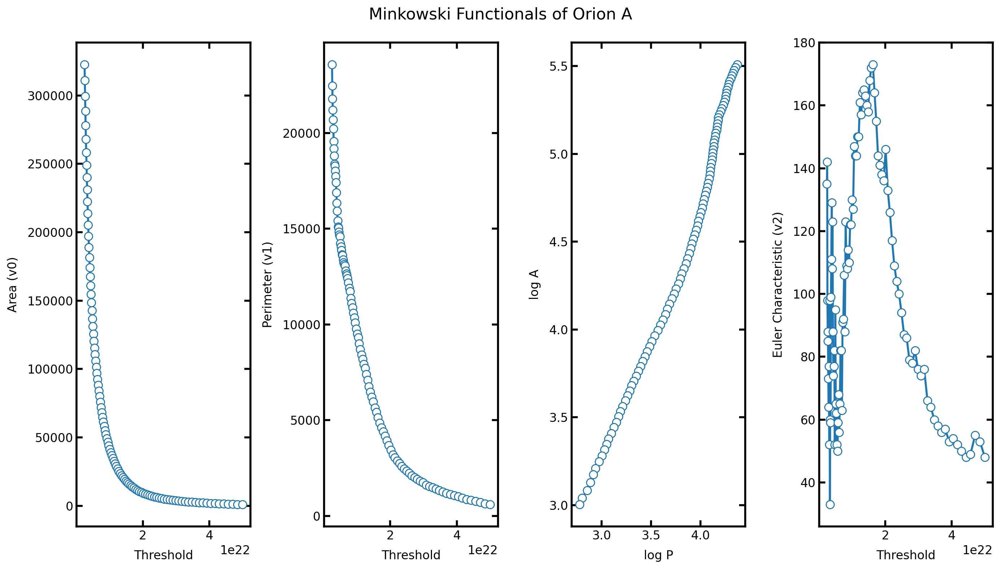

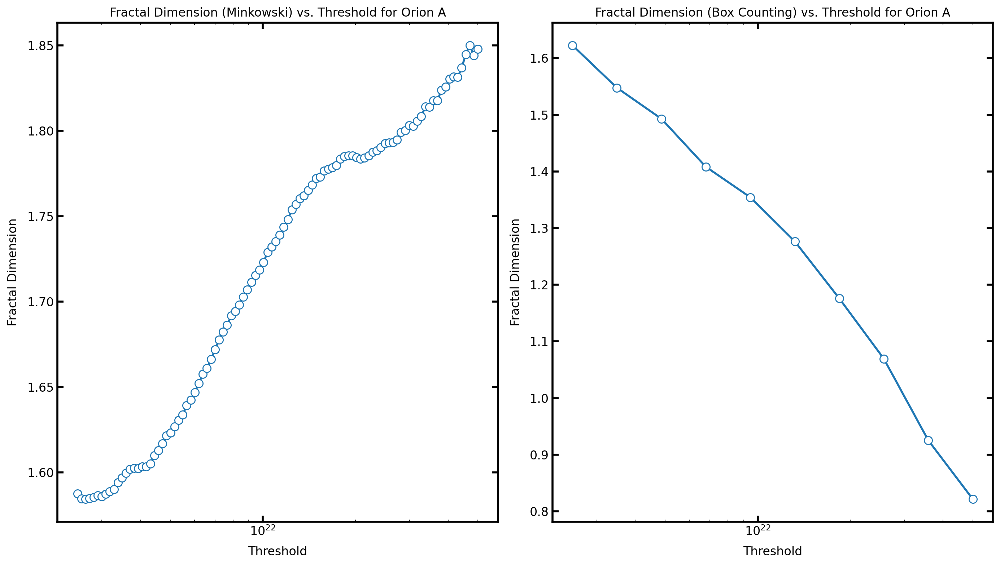

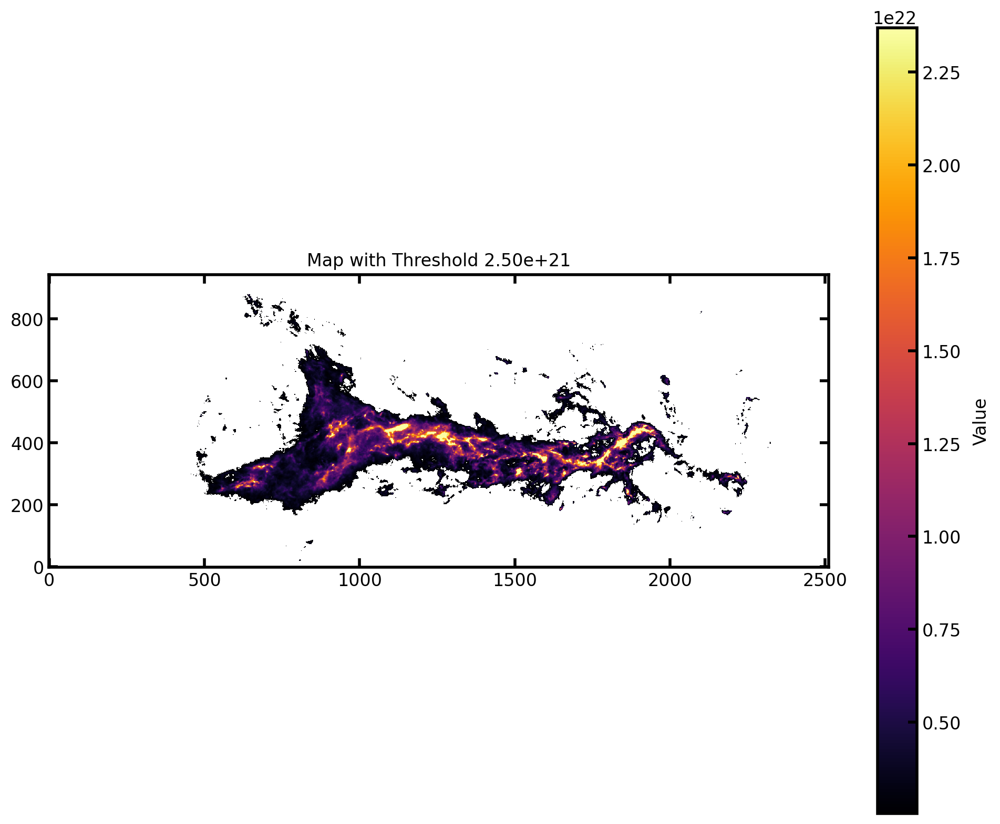

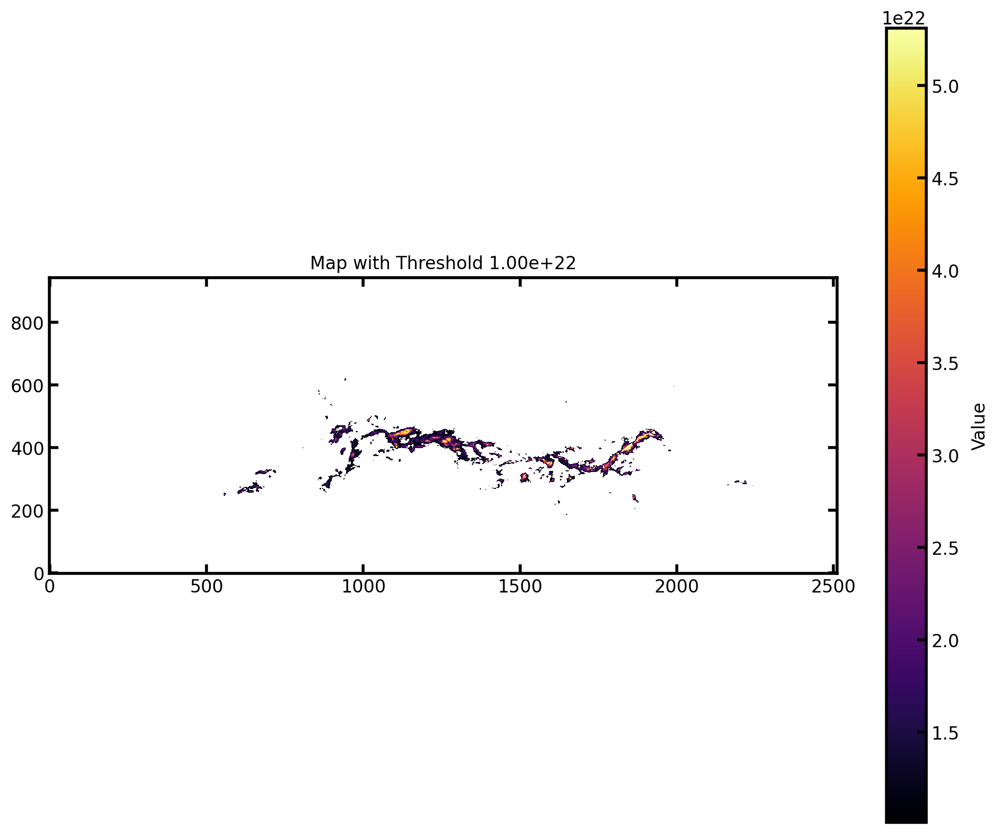

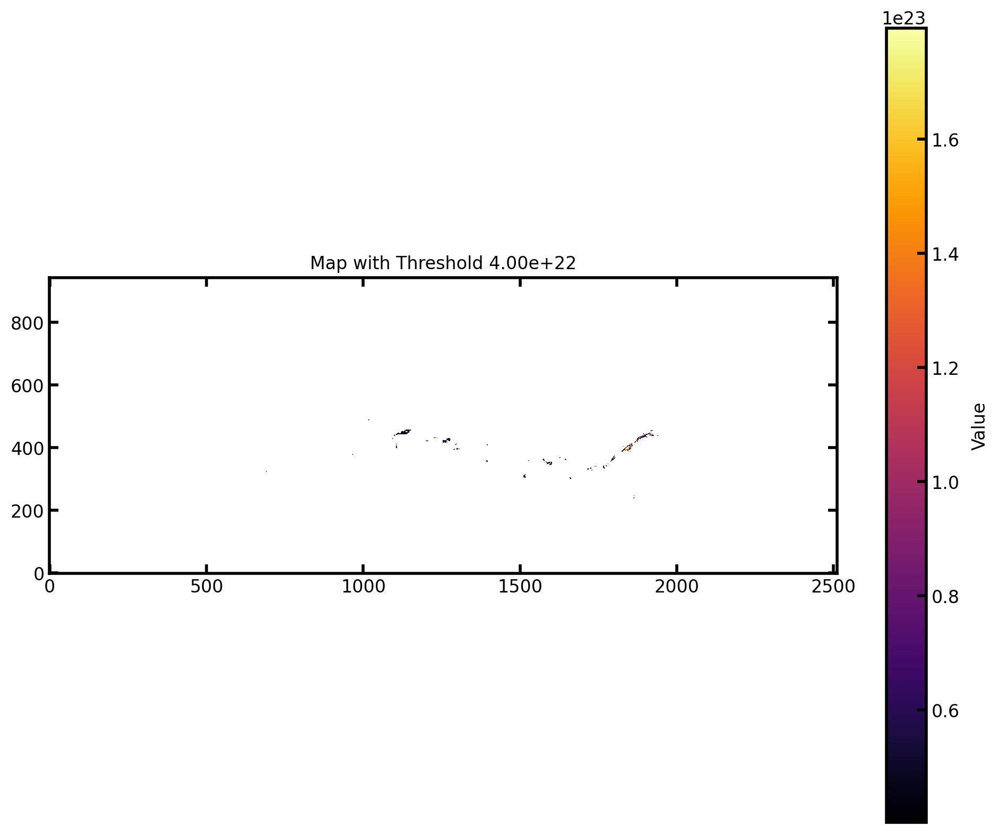

In [2]:
# Orion A
region_name = "Orion A"

# Minkowski
results_OA = standard_minkowski_functionals(N_H2_OA, threshold_min = 2.5e21, threshold_max = 5e22)

# Box-Counting
fractal_dimensions_OA_BC = []

thresholds_BC = np.logspace(np.log10(2.5e21), np.log10(5e22), 10) # Less thresholds for faster computation, but still enough to see the trend

for threshold in thresholds_BC:
    mask = N_H2_OA >= threshold

    fractal_dim = box_counting(mask) 
    fractal_dimensions_OA_BC.append(fractal_dim)

# Plot the results
show_Minkowski_Functionals(region_name, results_OA)

plt.figure(figsize=(14, 8))

plt.subplot(1, 2, 1)
plt.plot(results_OA["thresholds"], results_OA["fractal_dimension"], 'o-')
plt.title("Fractal Dimension (Minkowski) vs. Threshold for "+region_name)
plt.xlabel('Threshold')
plt.ylabel('Fractal Dimension')
plt.xscale("log")

plt.subplot(1, 2, 2)
plt.plot(thresholds_BC, fractal_dimensions_OA_BC, 'o-')
plt.title("Fractal Dimension (Box Counting) vs. Threshold for "+region_name)
plt.xlabel('Threshold')
plt.ylabel('Fractal Dimension')
plt.xscale("log")

plt.tight_layout()
plt.show()

show_regions_with_sections(N_H2_OA, n_regions= 0, thresholds=[2.5e21, 1e22, 4e22])

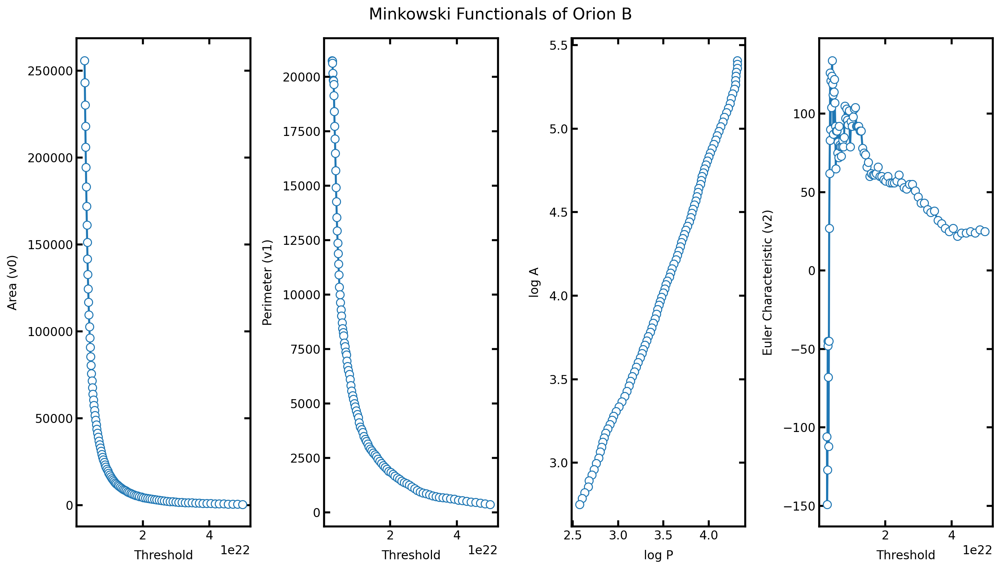

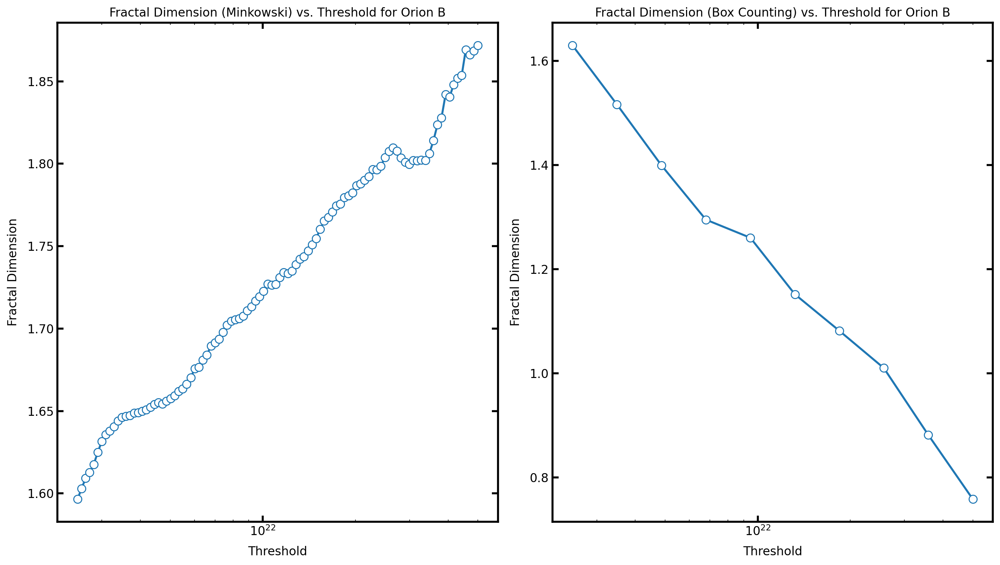

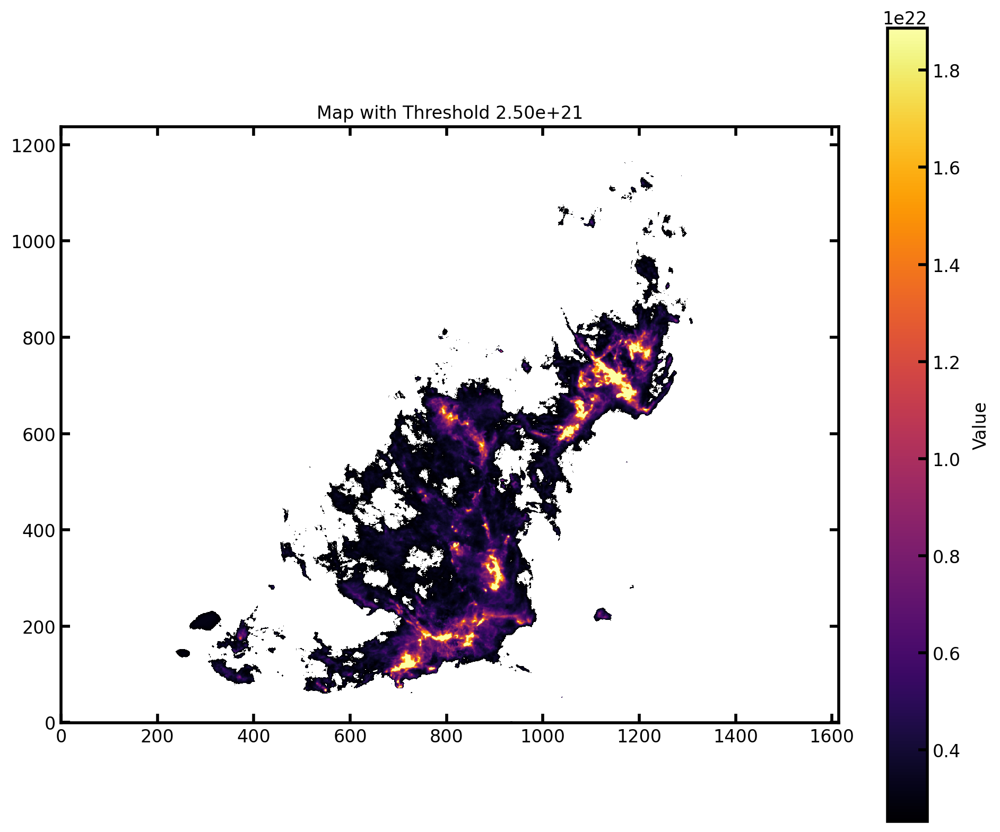

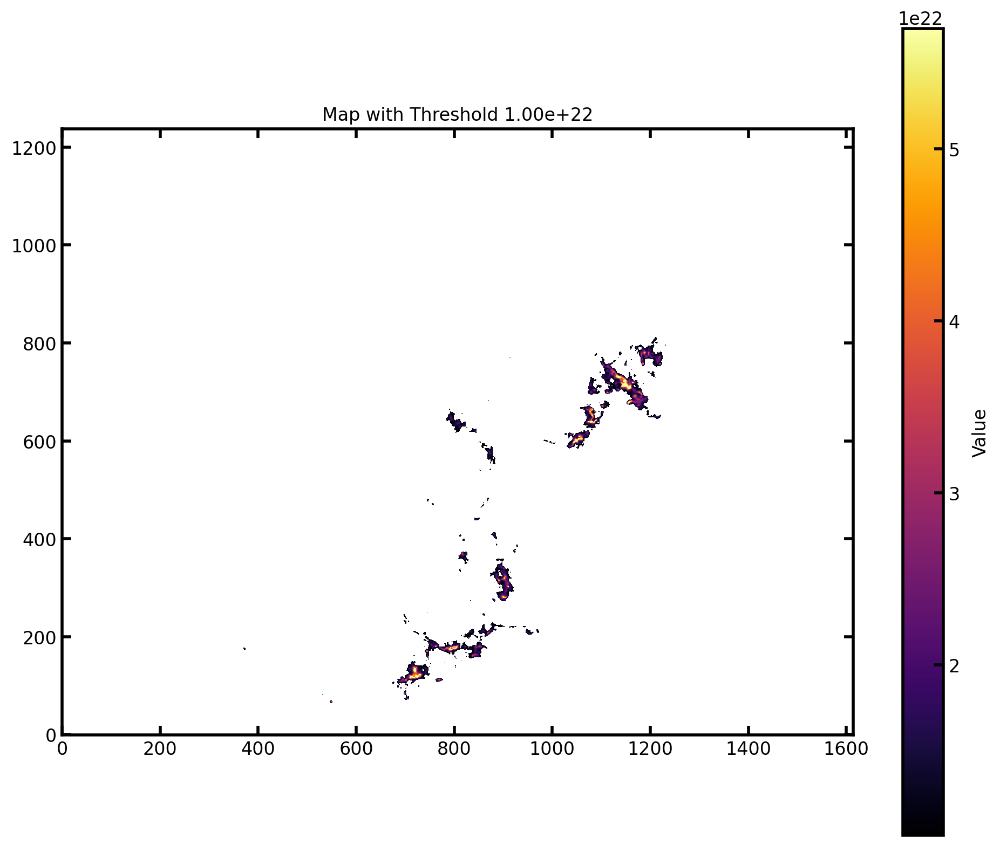

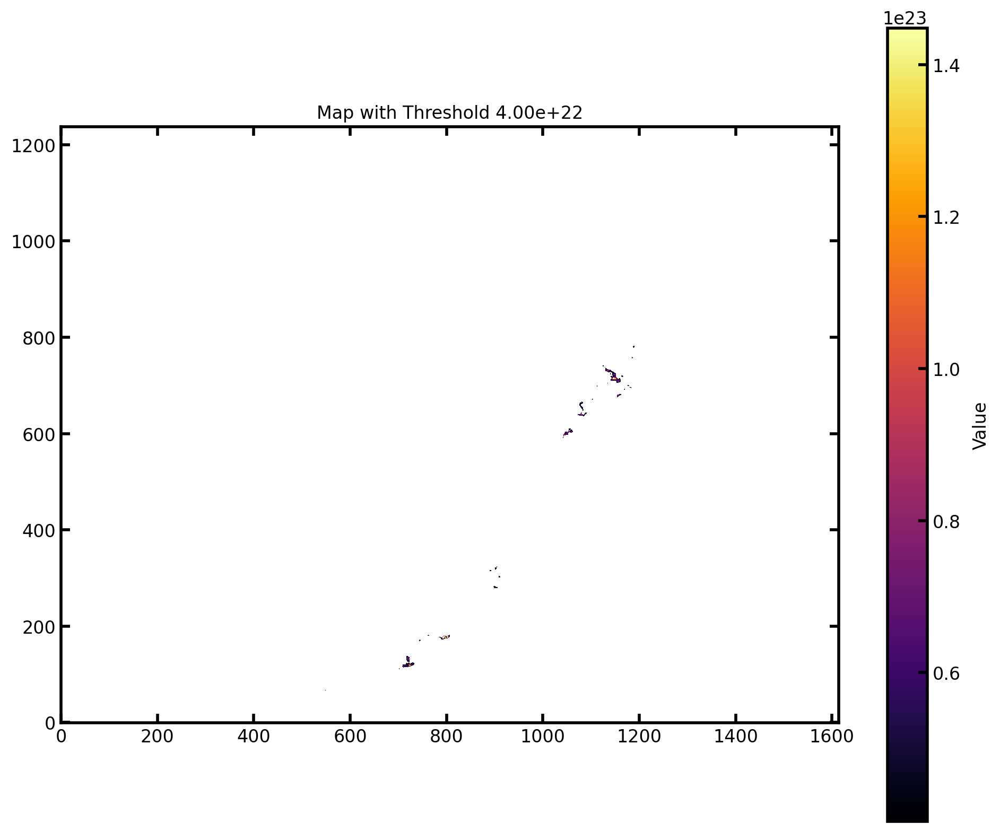

In [3]:
# Orion B
region_name = "Orion B"

# Minkowski
results_OB = standard_minkowski_functionals(N_H2_OB, threshold_min = 2.5e21, threshold_max = 5e22)

# Box-Counting
fractal_dimensions_OB_BC = []

thresholds_BC = np.logspace(np.log10(2.5e21), np.log10(5e22), 10) # Less thresholds for faster computation, but still enough to see the trend

for threshold in thresholds_BC:
    mask = N_H2_OB >= threshold

    fractal_dim = box_counting(mask)
    fractal_dimensions_OB_BC.append(fractal_dim)

# Plot the results
show_Minkowski_Functionals(region_name, results_OB)

plt.figure(figsize=(14, 8))

plt.subplot(1, 2, 1)
plt.plot(results_OB["thresholds"], results_OB["fractal_dimension"], 'o-')
plt.title("Fractal Dimension (Minkowski) vs. Threshold for "+region_name)
plt.xlabel('Threshold')
plt.ylabel('Fractal Dimension')
plt.xscale("log")

plt.subplot(1, 2, 2)
plt.plot(thresholds_BC, fractal_dimensions_OB_BC, 'o-')
plt.title("Fractal Dimension (Box Counting) vs. Threshold for "+region_name)
plt.xlabel('Threshold')
plt.ylabel('Fractal Dimension')
plt.xscale("log")

plt.tight_layout()
plt.show()

show_regions_with_sections(N_H2_OB, n_regions= 0, thresholds=[2.5e21, 1e22, 4e22])

## 📌**Region Analysis**

### *Behavior of Single Regions Compared to the General Trend*

Now that we have established that the trend is meaningful, we can examine whether it also holds when analyzing smaller regions. First, we divide the map using simple straight-line divisions. Then, we define regions based on the map itself. The latter method operates as follows:

- At each threshold, interconnected structures are identified using `ndimage.label(mask)`.
- Since many structures (especially at lower thresholds) consist of only a few pixels, only the 5-10 largest structures at each threshold are analyzed (i.e., the PA analysis is performed on each of them).
- The fractal dimension of these 10 structures at each threshold is plotted.
- Mass and size are also calculated, allowing for the creation of an M-L-D diagram.

### **Results**

In all cases, the trend remains but is often less steep for individual regions compared to the fractal dimension of the overall structure. 

The final results connect the fractal dimension with the mass and size of these structures, revealing a subtle trend, particularly around an aspect ratio \( A < 3 \) (representing prolate spheroids). This suggests that the geometry of the structure's contour changes—becoming smoother and more linear—toward very small star-forming cores, which follow a more spherical structure.

The code still needs to be reviewed (e.g. some 1-5 solar masses cores are expected to show up, but they don't), but I think these are good preliminary results so far. 

Kolmogorov turbulence predicts a fractal dimension of 5/3 (1.7) for turbulent isobar models, and this might be observable in our results!

### **Open Points**
- The structures are disconnected from one another between thresholds levels. In principle it should be possible to track the evolution (breaking apart) of structures in substructures.
- Mass and Size calculations to be reviewed.

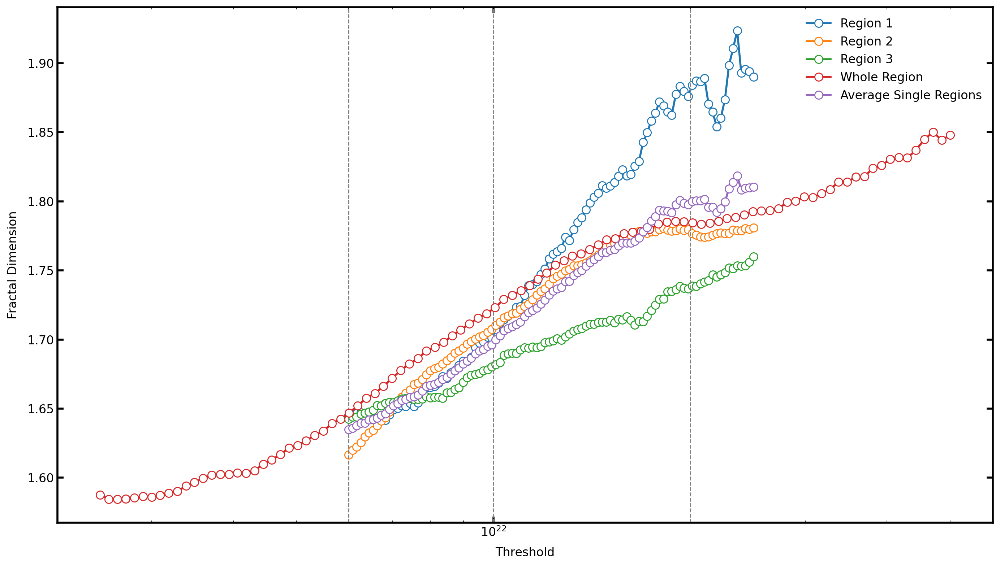

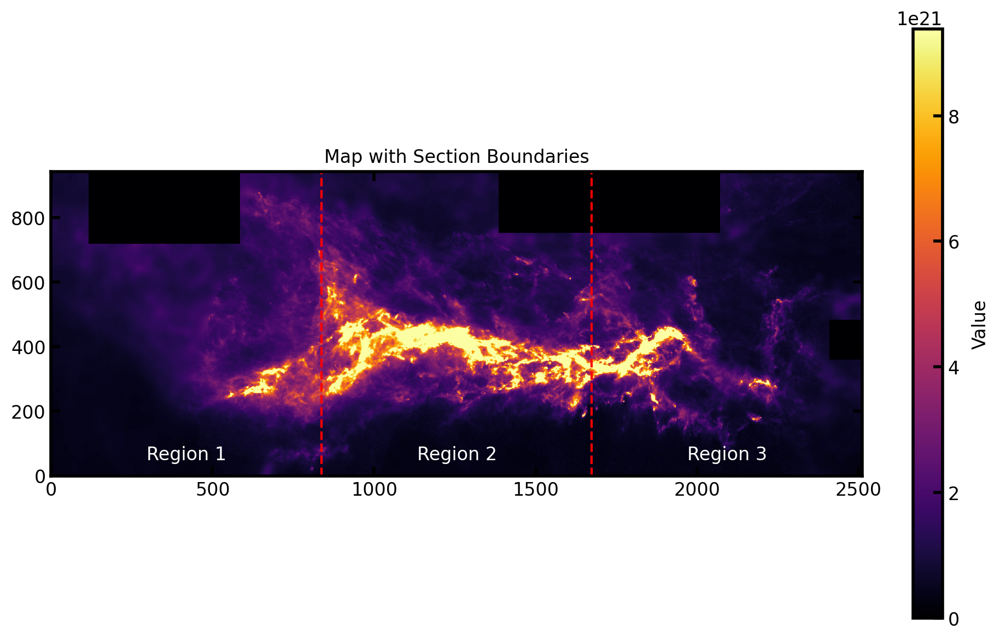

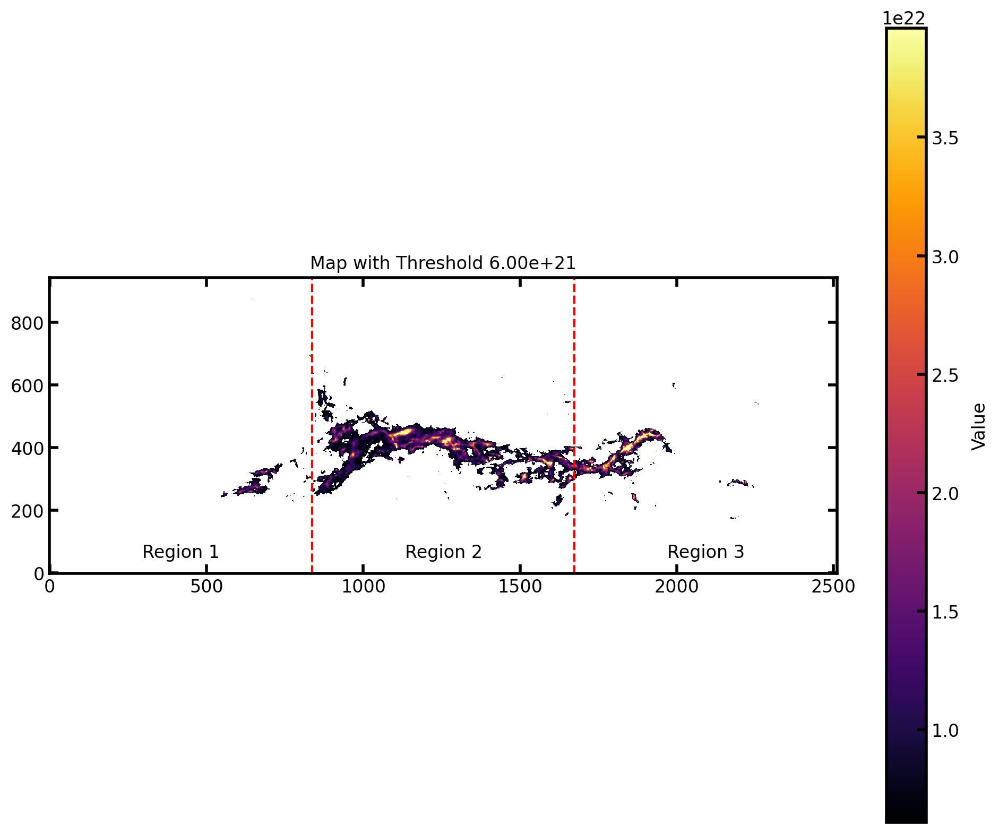

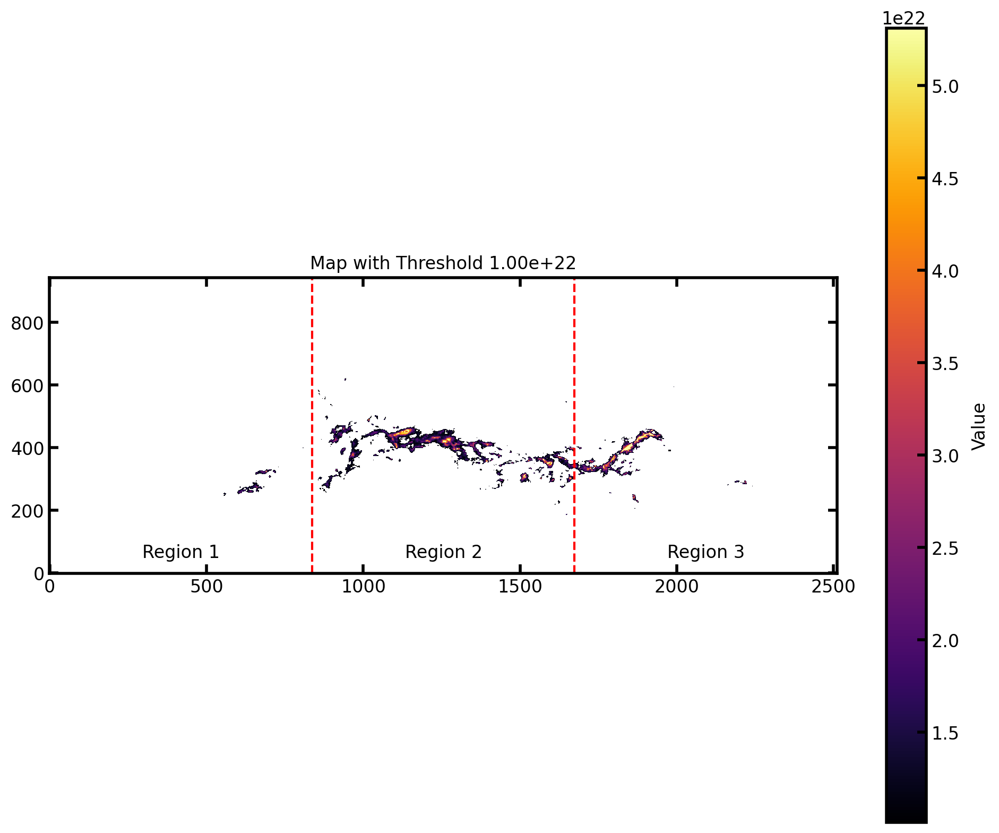

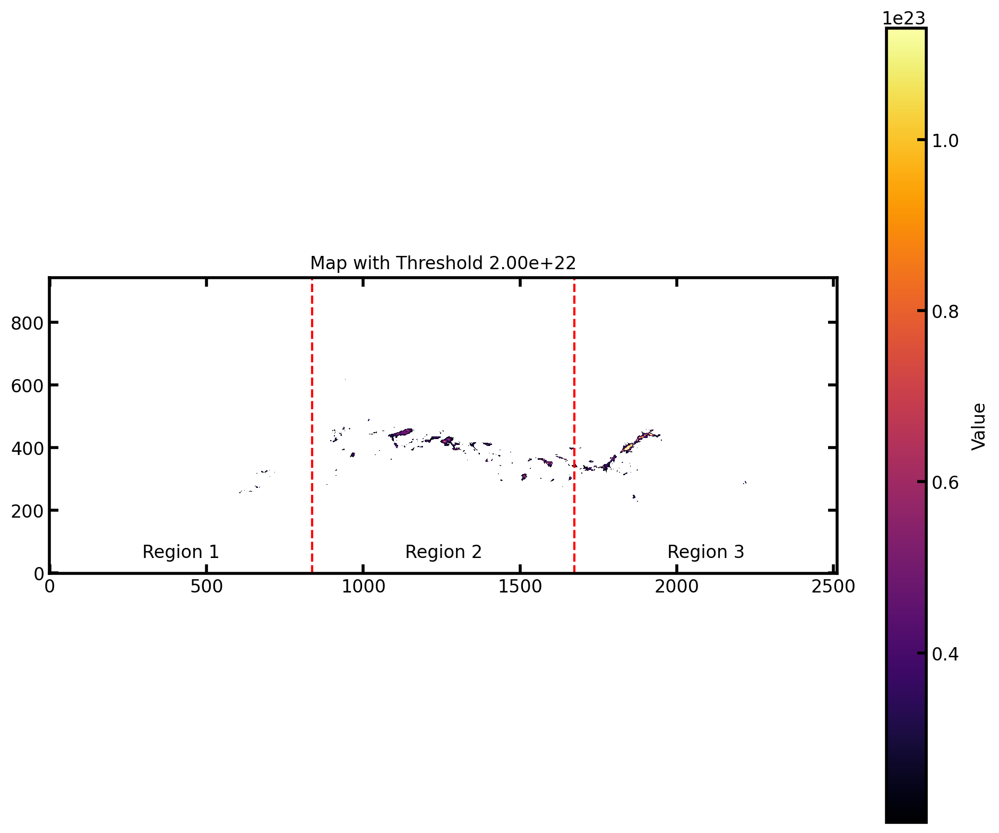

In [4]:
n_regions = 3 # 2 or 3
thresholds_to_plot = [6e21, 1e22, 2e22]
fractal_dimensions, thresholds = horizontal_marching_minkowski_functionals(N_H2_OA, n_regions)

plt.figure(figsize=(14, 8))

for i in range(0, n_regions):
    plt.plot(thresholds, fractal_dimensions[i][0], '-o', label="Region "+str(i+1))
    for threshold in thresholds_to_plot:
        plt.axvline(x=threshold, color='gray', linestyle='--', linewidth=1)

thresholds_full = np.logspace(np.log10(2.5e21), np.log10(5e22), 100)
plt.plot(thresholds_full, results_OA["fractal_dimension"], '-o', label="Whole Region")
plt.plot(thresholds, np.mean(fractal_dimensions, axis=0)[0], '-o', label="Average Single Regions")

plt.xlabel('Threshold')
plt.ylabel('Fractal Dimension')
plt.xscale("log")
plt.legend()

show_regions_with_sections(N_H2_OA, n_regions, thresholds_to_plot)

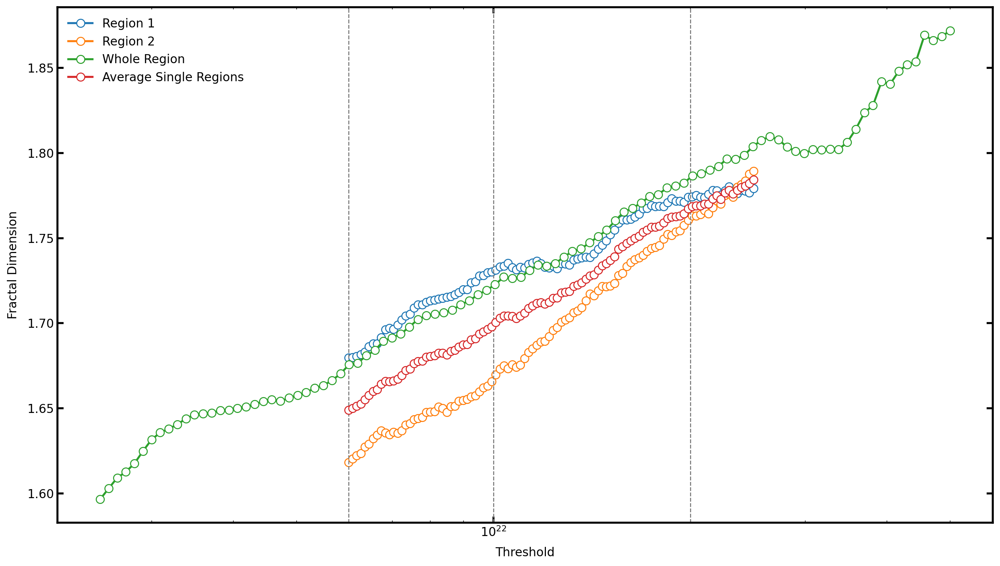

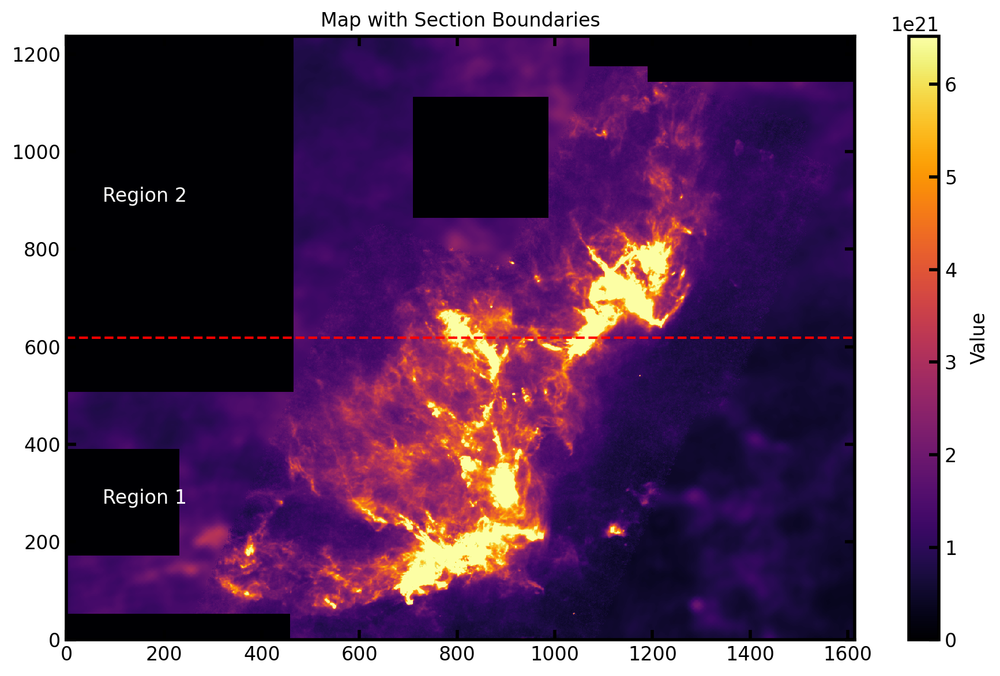

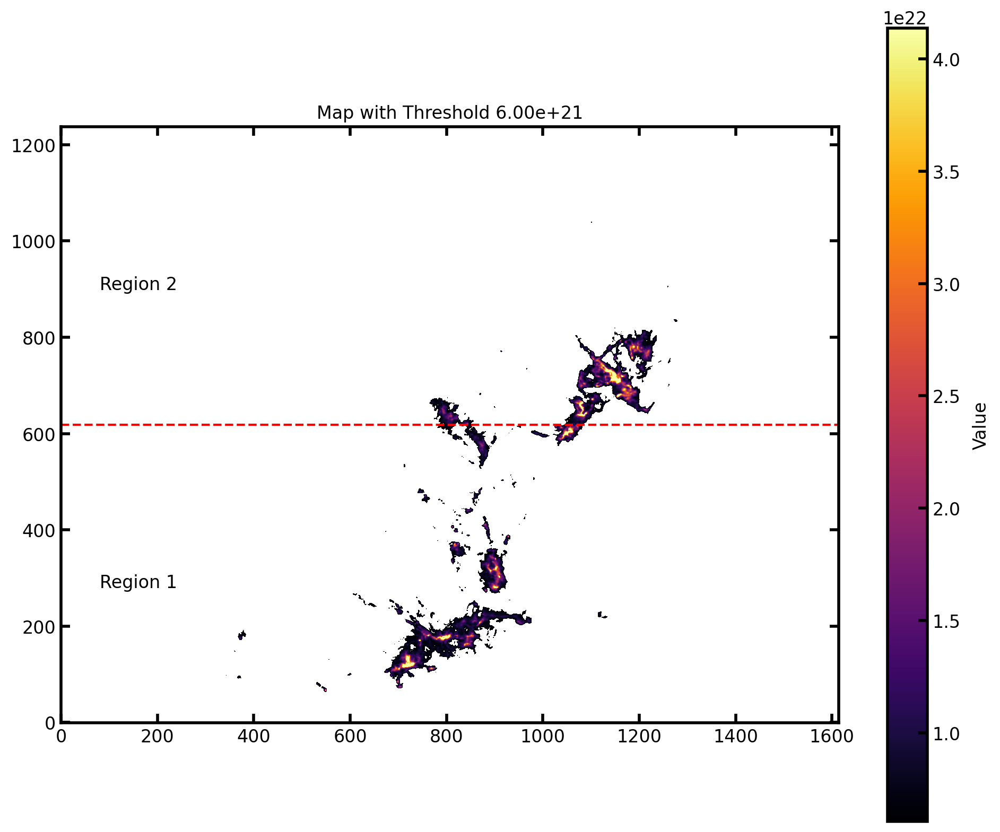

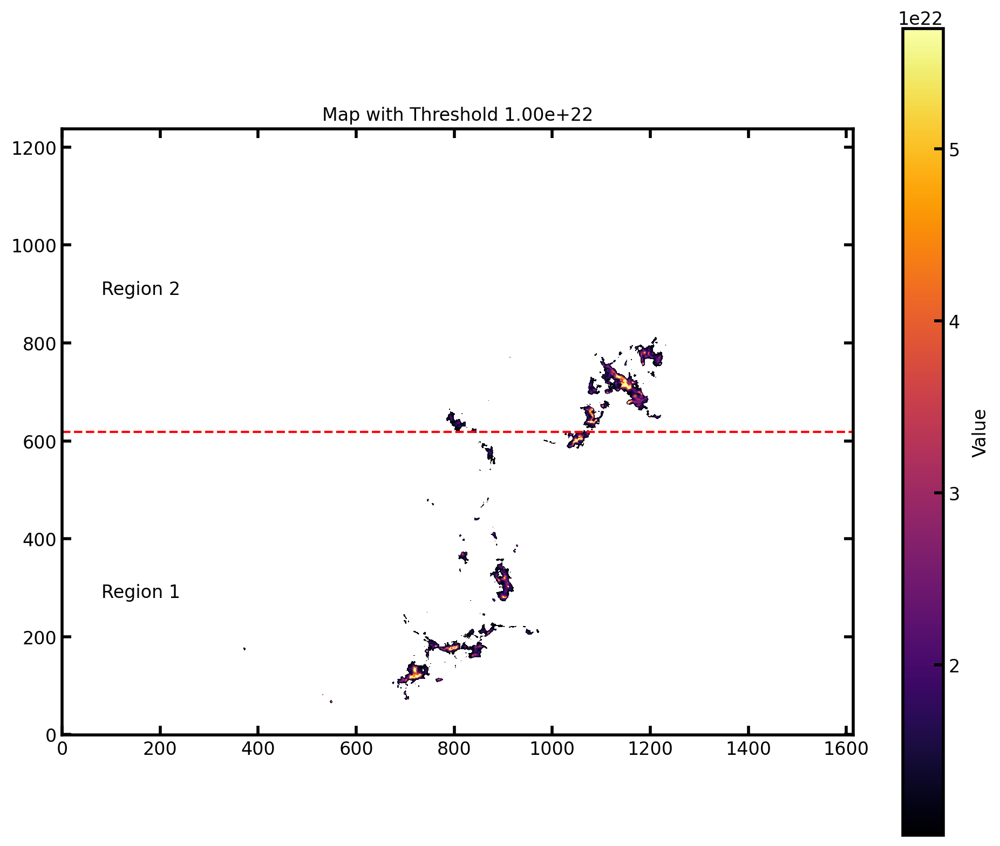

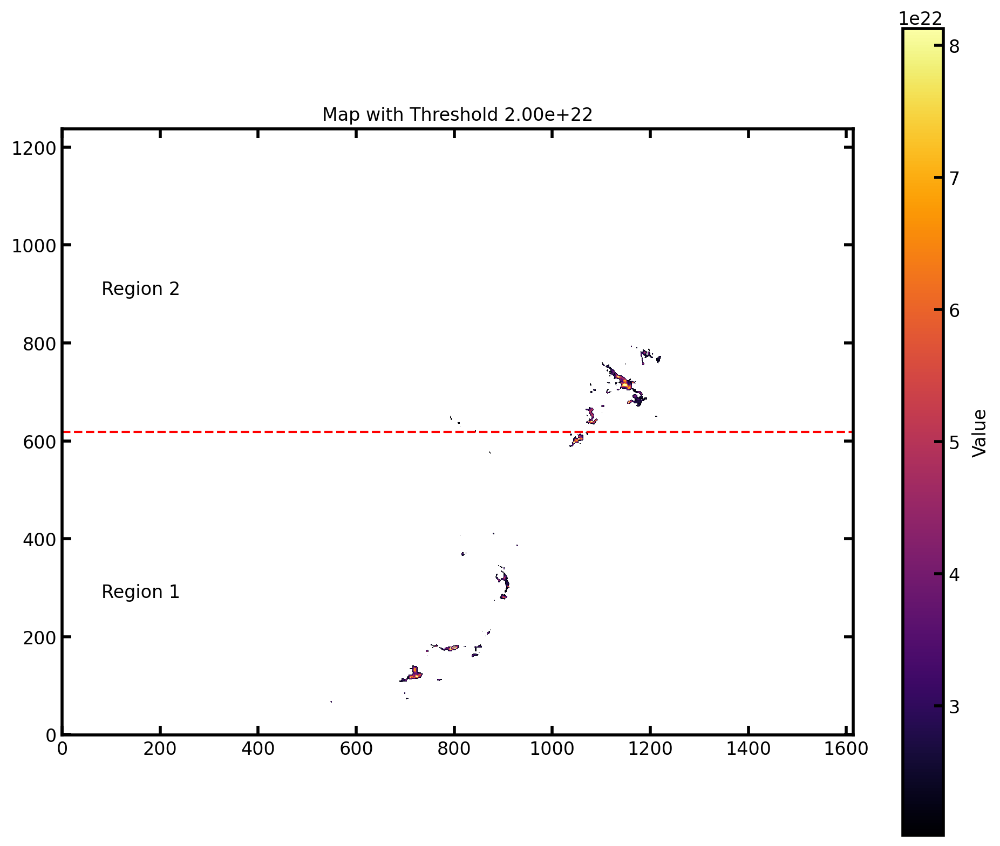

In [5]:
n_regions = 2 # 2 or 3
thresholds_to_plot = [6e21, 1e22, 2e22]
fractal_dimensions, thresholds = vertical_marching_minkowski_functionals(N_H2_OB, n_regions)

plt.figure(figsize=(14, 8))

for i in range(0, n_regions):
    plt.plot(thresholds, fractal_dimensions[i][0], '-o', label="Region "+str(i+1))
    for threshold in thresholds_to_plot:
        plt.axvline(x=threshold, color='gray', linestyle='--', linewidth=1)

thresholds_full = np.logspace(np.log10(2.5e21), np.log10(5e22), 100)
plt.plot(thresholds_full, results_OB["fractal_dimension"], '-o', label="Whole Region")
plt.plot(thresholds, np.mean(fractal_dimensions, axis=0)[0], '-o', label="Average Single Regions")

plt.xlabel('Threshold')
plt.ylabel('Fractal Dimension')
plt.xscale("log")
plt.legend()

show_sections_OrionB_vertical(N_H2_OB, n_regions, thresholds_to_plot)

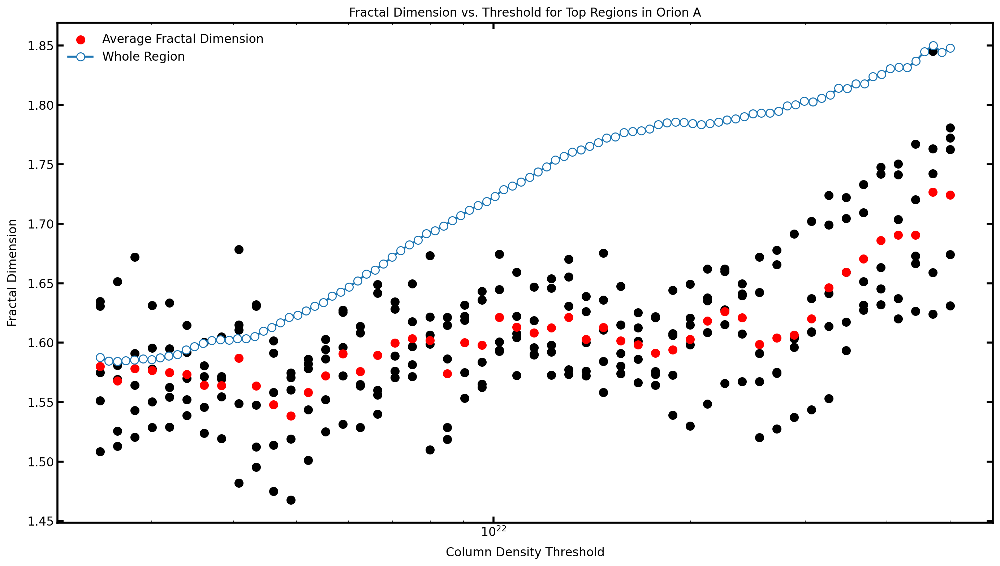

In [ ]:
# Dendograms-like approach to retrieve regions

pixel_scale = 0.00417
distance = 420
radians = 180/np.pi #conversion factor: rad in deg
rad_per_px = pixel_scale/radians
pc_per_px = np.sin(rad_per_px)*distance

M_H2_OA = convert_to_mass(N_H2_OA)

thresholds = np.logspace(np.log10(2.5e21), np.log10(5e22), 50) 

top_regions_data_OA = track_largest_regions(N_H2_OA, M_H2_OA, thresholds, pc_per_px)

plt.figure(figsize=(14, 8))

average_fractal_dim = np.zeros_like(thresholds)
count = np.zeros_like(thresholds)

for region_id, data in top_regions_data_OA.items():
    plt.scatter(data["thresholds"], data["fractal_dimensions"], marker='o', c="black")
    for i, threshold in enumerate(data["thresholds"]):
        idx = np.where(thresholds == threshold)[0][0]
        average_fractal_dim[idx] += data["fractal_dimensions"][i]
        count[idx] += 1

# Avoid division by zero
count[count == 0] = 1
average_fractal_dim /= count

# Plot the average fractal dimension at each threshold in red
plt.scatter(thresholds, average_fractal_dim, marker='o', color='red', label="Average Fractal Dimension")

plt.xlabel("Column Density Threshold")
plt.ylabel('Fractal Dimension')
plt.xscale("log")
plt.title("Fractal Dimension vs. Threshold for Top Regions in Orion A")

thresholds_full = np.logspace(np.log10(2.5e21), np.log10(5e22), 100)
plt.plot(thresholds_full, results_OA["fractal_dimension"], '-o', label="Whole Region")

plt.legend()
plt.show()

# Retrieve mass and size for each region and plot them with fractal dimension as the color map
masses_OA = []
sizes_OA = []
fractal_dims_OA = []

for region_id, data in top_regions_data_OA.items():
    for i, threshold in enumerate(data["thresholds"]):
        masses_OA.append(data["mass"][i])
        sizes_OA.append(data["size"][i])
        fractal_dims_OA.append(data["fractal_dimensions"][i])

masses_OA = np.array(masses_OA)
sizes_OA = np.array(sizes_OA)
fractal_dims_OA = np.array(fractal_dims_OA)

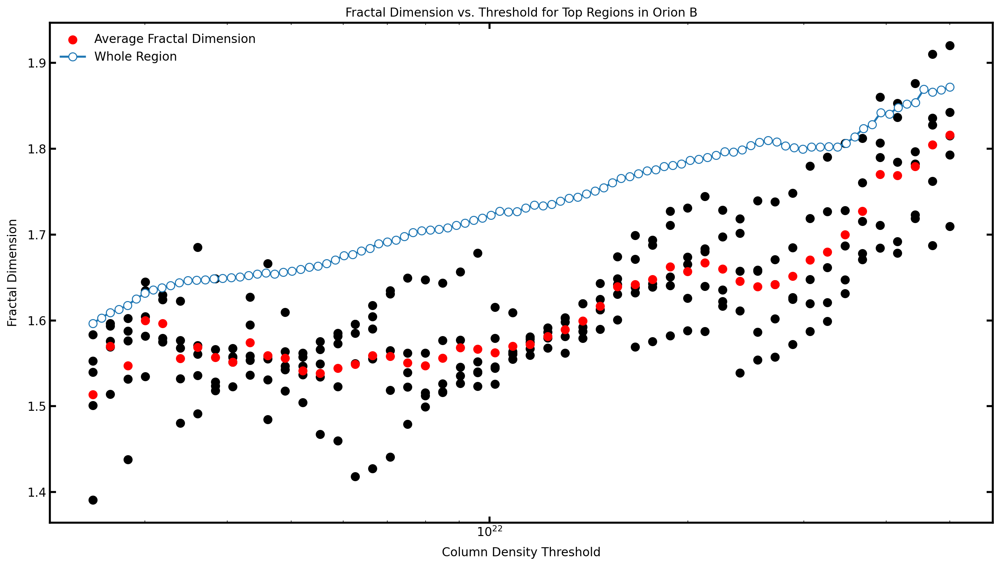

In [8]:
M_H2_OB = convert_to_mass(N_H2_OB)

thresholds = np.logspace(np.log10(2.5e21), np.log10(5e22), 50) 

top_regions_data_OB = track_largest_regions(N_H2_OB, M_H2_OB, thresholds, pc_per_px)

plt.figure(figsize=(14, 8))

average_fractal_dim = np.zeros_like(thresholds)
count = np.zeros_like(thresholds)

for region_id, data in top_regions_data_OB.items():
    plt.scatter(data["thresholds"], data["fractal_dimensions"], marker='o', c="black")
    for i, threshold in enumerate(data["thresholds"]):
        idx = np.where(thresholds == threshold)[0][0]
        average_fractal_dim[idx] += data["fractal_dimensions"][i]
        count[idx] += 1

# Avoid division by zero
count[count == 0] = 1
average_fractal_dim /= count

# Plot the average fractal dimension at each threshold in red
plt.scatter(thresholds, average_fractal_dim, marker='o', color='red', label="Average Fractal Dimension")

plt.xlabel("Column Density Threshold")
plt.ylabel('Fractal Dimension')
plt.xscale("log")
plt.title("Fractal Dimension vs. Threshold for Top Regions in Orion B")

thresholds_full = np.logspace(np.log10(2.5e21), np.log10(5e22), 100)
plt.plot(thresholds_full, results_OB["fractal_dimension"], '-o', label="Whole Region")

plt.legend()
plt.show()

# Retrieve mass and size for each region and plot them with fractal dimension as the color map
masses_OB = []
sizes_OB = []
fractal_dims_OB = []

for region_id, data in top_regions_data_OB.items():
    for i, threshold in enumerate(data["thresholds"]):
        masses_OB.append(data["mass"][i])
        sizes_OB.append(data["size"][i])
        fractal_dims_OB.append(data["fractal_dimensions"][i])

masses_OB = np.array(masses_OB)
sizes_OB = np.array(sizes_OB)
fractal_dims_OB = np.array(fractal_dims_OB)

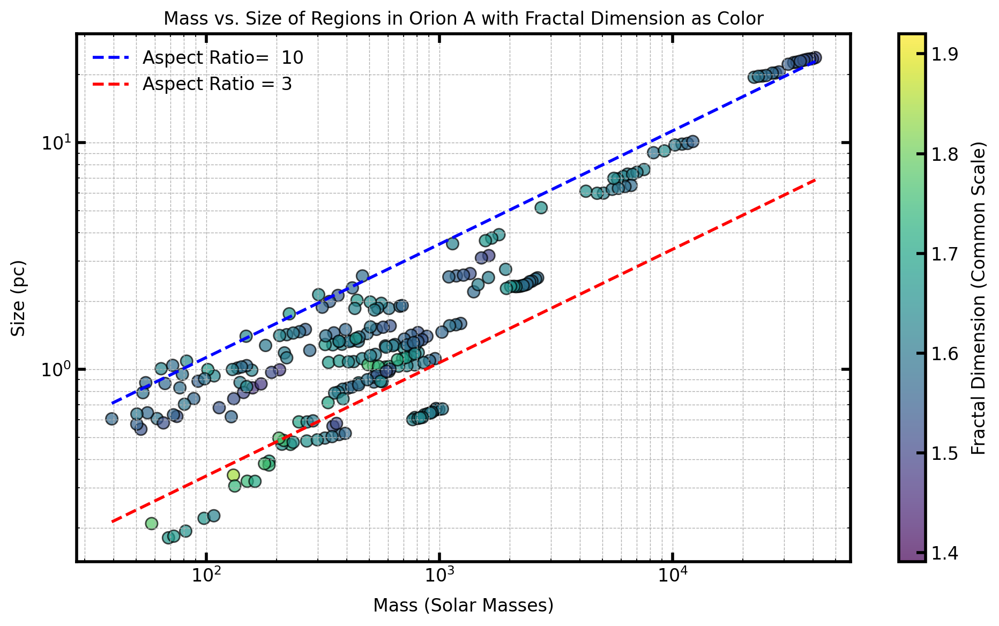

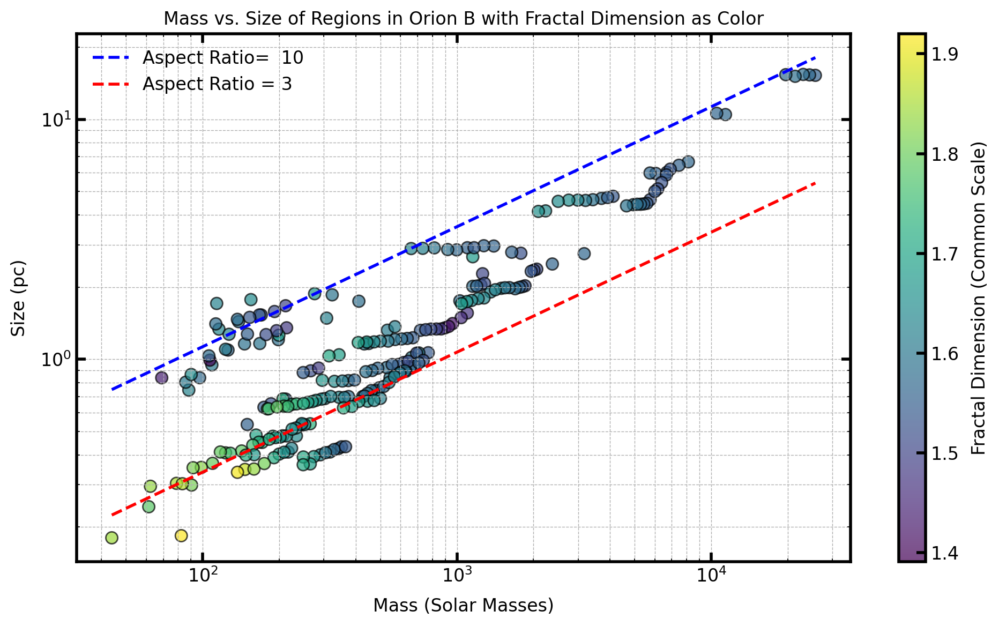

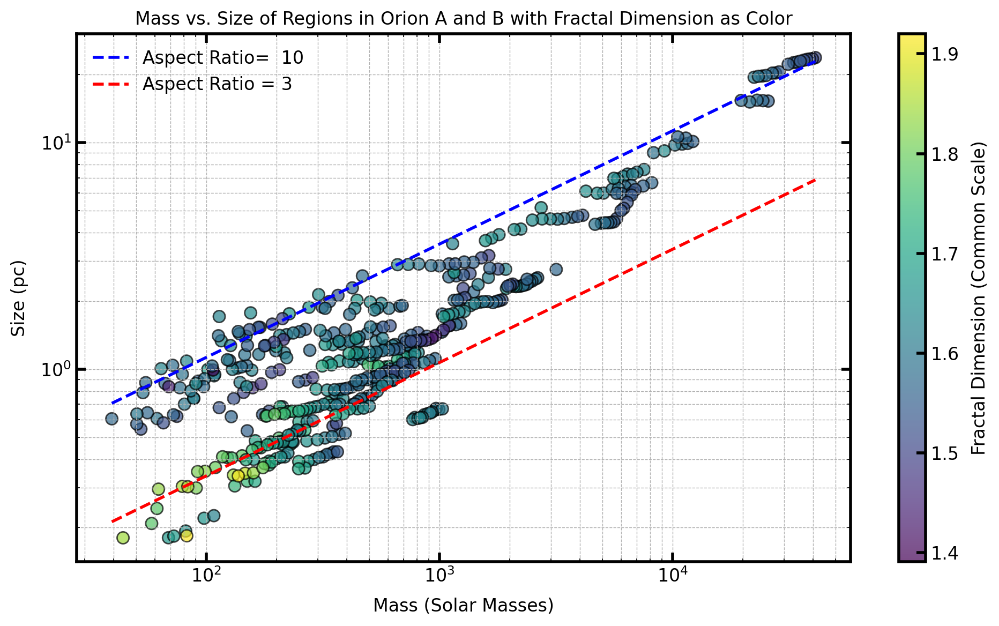

In [9]:
# Single Regions
visualize_Mass_Size_D_Diagrams(fractal_dims_OA, fractal_dims_OB, masses_OA, masses_OB, sizes_OA, sizes_OB)

# All
visualize_Mass_Size_D_Diagramm_as_One(fractal_dims_OA, fractal_dims_OB, masses_OA, masses_OB, sizes_OA, sizes_OB)

## 📌**Next Steps & Ideas to be Discussed**
- Tweak and review the code so far.
- Review and improve simulations (specifically in `Simulations_PA.ipynb`, as I have now a better understanding of the interpretation).
- Can we *quantitatively* link the observed fractal trends to star formation modes/efficency?
    - YSOs List from Megeath et al.
    - Relation YSOs/fractal dimension and star formation modes 🧐.
- Comparison with literature.


In [ ]:
# read the YSO list

# for each region: calculate how many YSOs are found within such region (update previous code)

# plot this information somehow?